<a href="https://colab.research.google.com/github/YoussefKhafaga/Augmented-reality-and-image-mosaicing/blob/main/Augmented_reality_and_image_mosaicing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dependencies


## In this section we import the needed libraries, and implemented the following functions:
- findHomography
- warpPerspective
- perspectiveTransform
- getCorrespondence

In [ ]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow
from tqdm import tqdm
import math,statistics

In [ ]:
def loadVid(path):
	# Create a VideoCapture object and read from input file
	# If the input is the camera, pass 0 instead of the video file name
	cap = cv.VideoCapture(path)
	 
	# Check if camera opened successfully
	if not cap.isOpened(): 
		print("Error opening video stream or file")

	i = 0
	# Read until video is completed
	while(cap.isOpened()):
		# Capture frame-by-frame
		i += 1
		ret, frame = cap.read()
		if ret == True:

			#Store the resulting frame
			if i == 1:
				frames = frame[np.newaxis, ...]
			else:
				frame = frame[np.newaxis, ...]
				frames = np.vstack([frames, frame])
				frames = np.squeeze(frames)
			
		else: 
			break
	 
	# When everything done, release the video capture object
	cap.release()

	return frames


In [ ]:
def correspondence(img1, img2,thresh=0.7):
  # Image 1 is the query --> image to be transformed
  # image 2 is the train image 
  sift = cv.SIFT_create()
  keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
  keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

  bf = cv.BFMatcher()
  matches = bf.knnMatch(descriptors_1,descriptors_2,k=2)
  good = []
  for m,n in matches:
    if m.distance < thresh*n.distance:
        good.append((m,m.distance))
  good = sorted(good, key = lambda x:x[1])
  good=[[m] for m,n in good]
  img3 = cv.drawMatchesKnn(img1,keypoints_1,img2,keypoints_2,good[:50],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  cv2_imshow(img3)
  return keypoints_1, keypoints_2, good

In [ ]:
def perspectiveTransform(pts,H):
  pts=np.float32(pts).reshape(-1,2)
  pts=np.append(pts,np.ones((pts.shape[0],1)),axis=1)
  pts=pts.reshape(-1,3,1)
  res=np.einsum('jk,ikl->ijl', H, pts)
  res=res.reshape(-1,3)
  res=[[u,v] for u,v in zip(res[:,0]/res[:,2],res[:,1]/res[:,2])]
  res=np.array(res)
  return res

In [ ]:
def computeHomography(pairs):
    A = []
    for x1, y1, x2, y2 in pairs:
        A.append([x1, y1, 1, 0, 0, 0, -x2 * x1, -x2 * y1, -x2])
        A.append([0, 0, 0, x1, y1, 1, -y2 * x1, -y2 * y1, -y2])
    A = np.array(A)
    U, S, V = np.linalg.svd(A)
    H = np.reshape(V[-1], (3, 3))
    H = (1 / H.item(8)) * H
    return H

def dist(pair, H):
    p1 = np.array([pair[0], pair[1], 1])
    p2 = np.array([pair[2], pair[3], 1])

    p2_estimate = np.dot(H, np.transpose(p1))
    p2_estimate = (1 / p2_estimate[2]) * p2_estimate
    
    return np.linalg.norm(np.transpose(p2) - p2_estimate)

def findHomography(kp1,kp2,matches, NUM_ITERS=100):
    point_map = np.array([
        [kp1[match[0].queryIdx].pt[0],
        kp1[match[0].queryIdx].pt[1],
        kp2[match[0].trainIdx].pt[0],
        kp2[match[0].trainIdx].pt[1]] for match in matches
    ])
    bestInliers = set()
    homography = None
    for i in range(NUM_ITERS):
        pairs = [point_map[i] for i in np.random.choice(len(point_map), 4)]
        H = computeHomography(pairs)
        inliers = {(c[0], c[1], c[2], c[3]) for c in point_map if dist(c, H) < 4}
        if len(inliers) > len(bestInliers):
            bestInliers = inliers
            homography = H
    return homography

In [ ]:
def to_matrix(img):
  if len(img.shape)==3:
    H,V,C = img.shape
    mtr = np.zeros((V,H,C), dtype='int')
    for i in range(img.shape[0]):
        mtr[:,i] = img[i]
    return mtr
  return img

def to_image(mtr):
  if len(mtr.shape)==3:
    V,H,C = mtr.shape
    img = np.zeros((H,V,C), dtype='int')
    for i in range(mtr.shape[0]):
        img[:,i] = mtr[i]
    return img
  return mtr
def inverse(img,ref,M):
    dummy =  np.argwhere(img[:,:,:] != 0)
    min_y,max_y,min_x,max_x = dummy[:,0].min(),dummy[:,0].max(),dummy[:,1].min(),dummy[:,1].max()
    y,x,_=np.where(img[min_y:max_y,min_x:max_x]==(0,0,0))
    x=x+min_x
    y=y+min_y
    A=[[u,v] for u,v in zip(x,y)]
    A=np.array(A)
    pts=perspectiveTransform(A,np. linalg. inv(M))
    H,W,_=ref.shape
    ref,img=to_matrix(ref),to_matrix(img)
    for i,(x,y) in enumerate(pts):
      if x>0 and x<W and y>0 and y<H:
        avg=0
        xi,yi=x-np.int32(x),y-np.int32(y)
        w=[xi*yi,(1-xi)*yi,xi*(1-yi),(1-yi)*(1-xi)]
        for j,p in enumerate([(math.ceil(x),math.ceil(y)),(math.floor(x),math.ceil(y)),(math.ceil(x),math.floor(y)),(math.floor(x),math.floor(y))]):
          if p[0]>0 and p[0]<W and p[1]>0 and p[1]<H:
            try:
              avg+=w[j]*ref[p[0],p[1],:]
            except:
              print(p[0],p[1],i)
              break
        img[A[i][0],A[i][1],:]=avg
    return to_image(img)
    
def warpPerspective(img, M, dsize):
    mtr = to_matrix(img)
    R,C = dsize
    if len(mtr.shape)==3:
      dst = np.zeros((R,C,mtr.shape[2]))
    else:
      dst = np.zeros((R,C))
    for i in range(mtr.shape[0]):
        for j in range(mtr.shape[1]):
            res = np.dot(M, [i,j,1])
            i2,j2,_ = (res / res[2] + 0.5).astype(int)
            if i2 >= 0 and i2 < R:
                if j2 >= 0 and j2 < C:
                    dst[i2,j2] = mtr[i,j]
    
    return inverse(to_image(dst),img,M)

In [ ]:
def remove_zero_pad(image):
    dummy = np.argwhere(image[:,:,:] != 0) 
    if dummy.size ==0:
      return image
    min_y,max_y,min_x,max_x = dummy[:,0].min(),dummy[:,0].max(),dummy[:,1].min(),dummy[:,1].max()
    crop_image = image[min_y:max_y,min_x:max_x]
    return crop_image

#Part 1

## Match the cover with each video frame

In [ ]:
bookvid = loadVid('/content/book.mov')

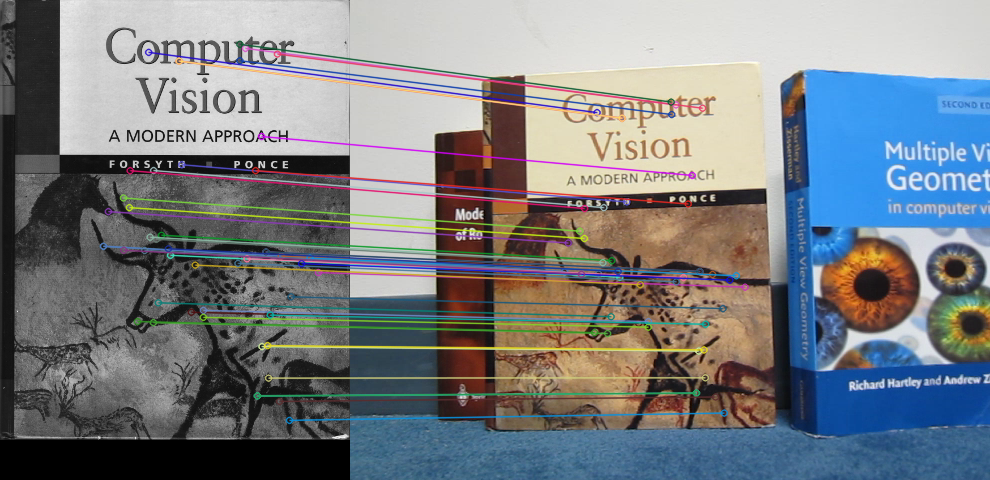

In [ ]:
img1 = bookvid[-1]
cover=cv.imread('/content/cv_cover.jpg')
keypoints_1, keypoints_2, good = correspondence(cover,img1)

In [ ]:
H=findHomography(keypoints_1, keypoints_2,good)
h,w,_ = cover.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ])
dst = np.int32(perspectiveTransform(pts,H)).reshape(-1,1,2)
img1 = cv.polylines(img1,[dst],True,255,3, cv.LINE_AA)

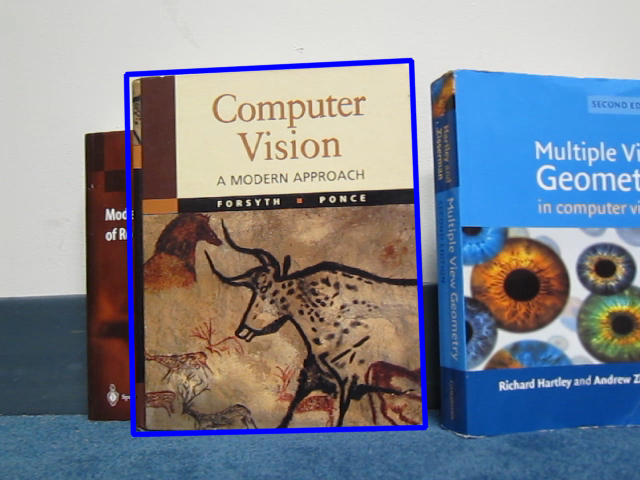

In [ ]:
cv2_imshow(img1)

## Crop video frames

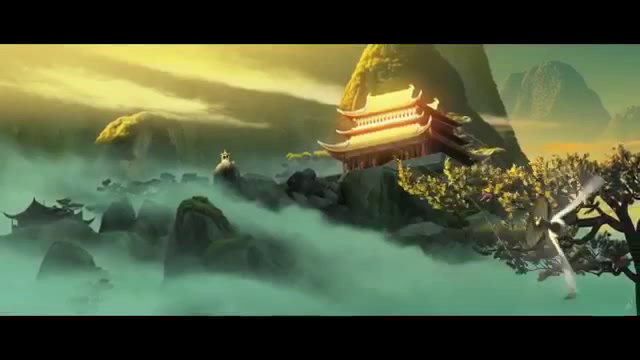

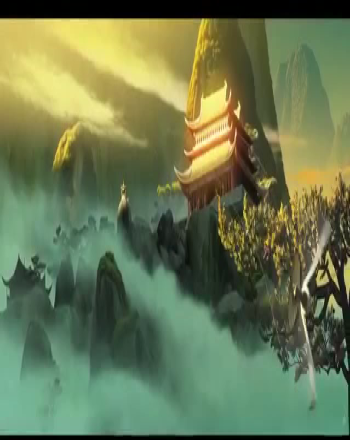

In [ ]:
sourceVid = loadVid('/content/ar_source.mov')
cv2_imshow(sourceVid[0])
hc,wc,_=cover.shape
cropped=np.array(list(map(lambda x: cv.resize(remove_zero_pad(x), (wc,hc) , interpolation = cv.INTER_AREA),sourceVid)))
cv2_imshow(cropped[0])

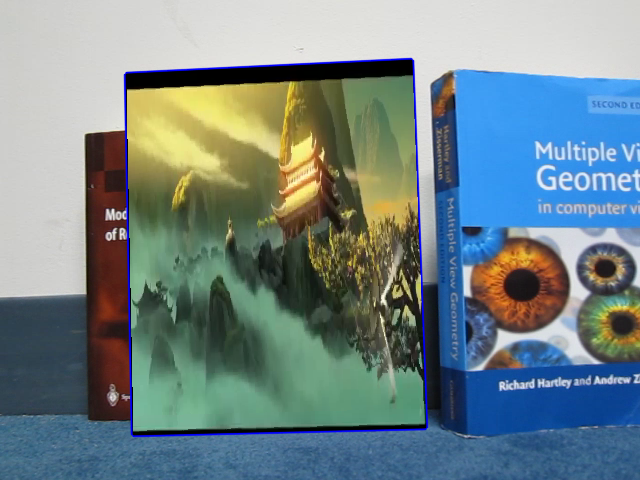

In [ ]:
  res= warpPerspective(cropped[0],H,(bookvid[-1].shape[1],bookvid[-1].shape[0]))
  h,w,_ = cover.shape
  pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ])
  dst = np.int32(perspectiveTransform(pts,H)).reshape(-1,1,2)
  cv.fillConvexPoly(img1, dst, 0, 16)
  cv2_imshow(img1+np.uint8(res))

## play the video inside the book

In [ ]:
def wrap(frame,img):
  final=np.copy(frame)
  framecp=np.copy(frame)
  keypoints_1, keypoints_2, good = correspondence(cover,framecp)
  M=findHomography(keypoints_1, keypoints_2,good)
  res= warpPerspective(img,M,(framecp.shape[1],framecp.shape[0]))
  h,w,_ = cover.shape
  pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ])
  dst = np.int32(perspectiveTransform(pts,M)).reshape(-1,1,2)
  cv.fillConvexPoly(final, dst, 0, 16)
  return final+res

In [ ]:
writer = cv.VideoWriter("outputvideo1.mp4", cv.VideoWriter_fourcc(*"mp4v"), 30,(bookvid[0].shape[1],bookvid[0].shape[0]))
count=min(len(cropped),len(bookvid))
for i in tqdm(range(count)):
  writer.write(np.uint8(wrap(bookvid[i],cropped[i])))
writer.release()

 28%|██▊       | 144/511 [12:16<21:01,  3.44s/it]

#Part 2

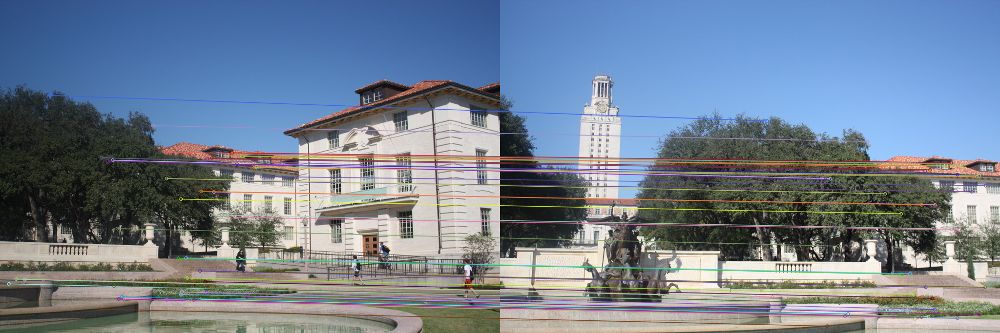

In [ ]:
img1 = cv.imread("image1.jpg")
img2 = cv.imread("image2.jpg")
assert type(img1) is np.ndarray
assert type(img2) is np.ndarray
keypoints_1, keypoints_2, matches = correspondence(img1, img2)

In [ ]:
H=findHomography(keypoints_1, keypoints_2,matches)
H

array([[ 7.58156650e-01,  5.00255483e-02,  4.42359400e+02],
       [-1.42331528e-01,  9.15032643e-01,  7.70513991e+01],
       [-2.23589454e-04, -2.31897426e-05,  1.00000000e+00]])

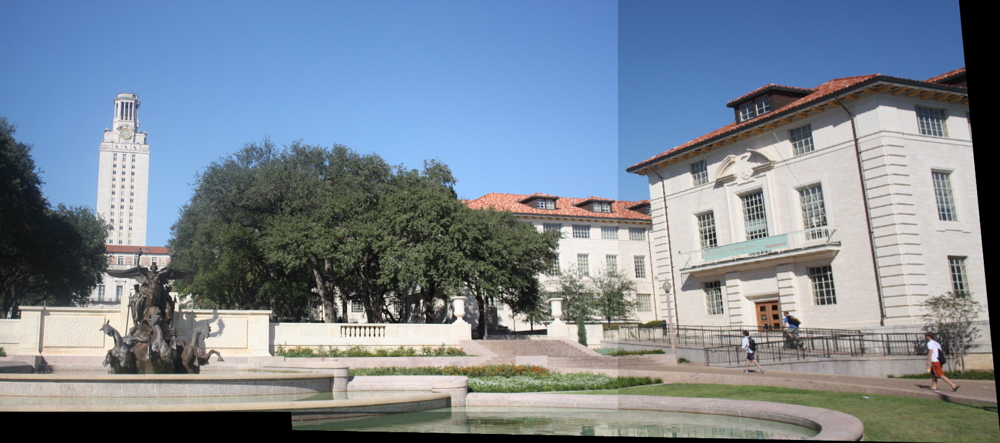

In [ ]:
result =warpPerspective(img1,H,(img1.shape[1]+img2.shape[1],img1.shape[0]+img2.shape[0]))
result[0:img2.shape[0], 0:img2.shape[1]] = img2
#todo: use histogram matching or laplacian blending
cv2_imshow(remove_zero_pad(result))

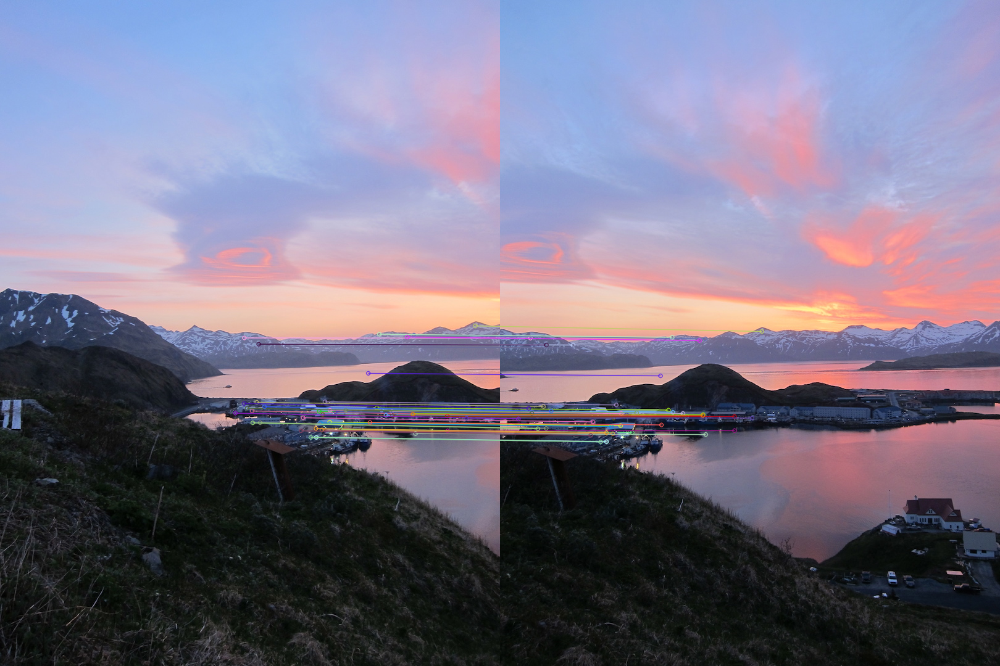

In [ ]:
additionalimg1 = cv.imread("1.jpg")
additionalimg2 = cv.imread("2.jpg")
assert type(additionalimg1) is np.ndarray
assert type(additionalimg2) is np.ndarray
keypoints_1, keypoints_2, matches = correspondence(additionalimg1, additionalimg2)

In [ ]:
H=findHomography(keypoints_1, keypoints_2,matches)
H

array([[ 1.40652549e+00, -2.52880128e-02, -4.83746651e+02],
       [ 2.78786589e-01,  1.34188088e+00, -1.84522087e+02],
       [ 4.58962759e-04,  5.01066355e-05,  1.00000000e+00]])

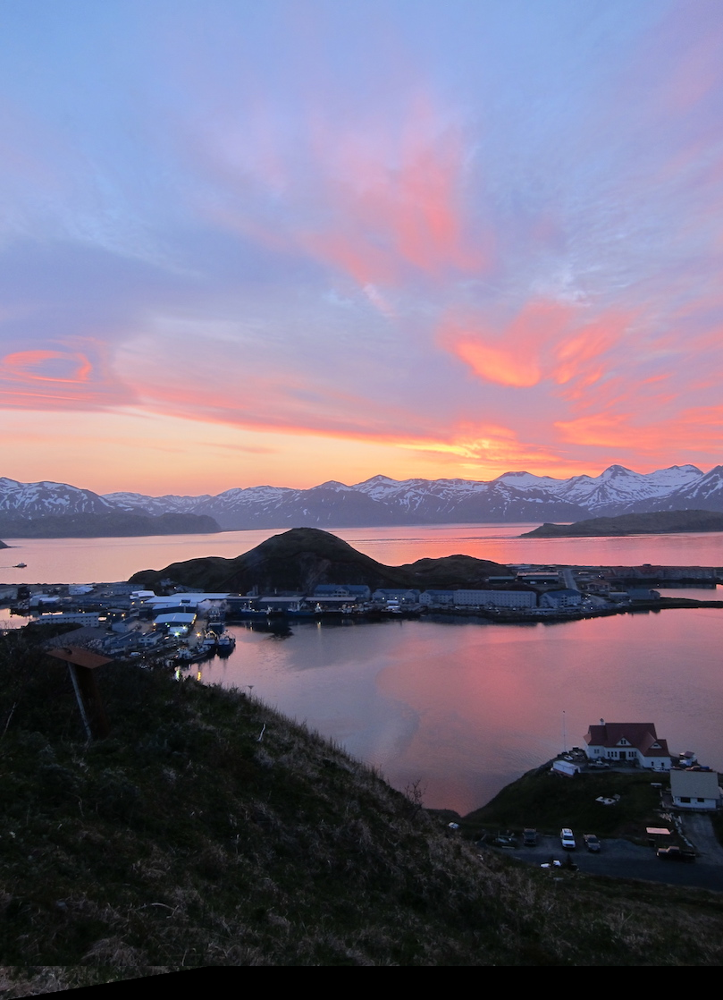

In [ ]:
result =warpPerspective(additionalimg1,H,(additionalimg1.shape[1]+additionalimg2.shape[1],additionalimg1.shape[0]+additionalimg2.shape[0]))
result[0:additionalimg2.shape[0], 0:additionalimg2.shape[1]] = additionalimg2
#todo: use histogram matching or laplacian blending
cv2_imshow(remove_zero_pad(result))

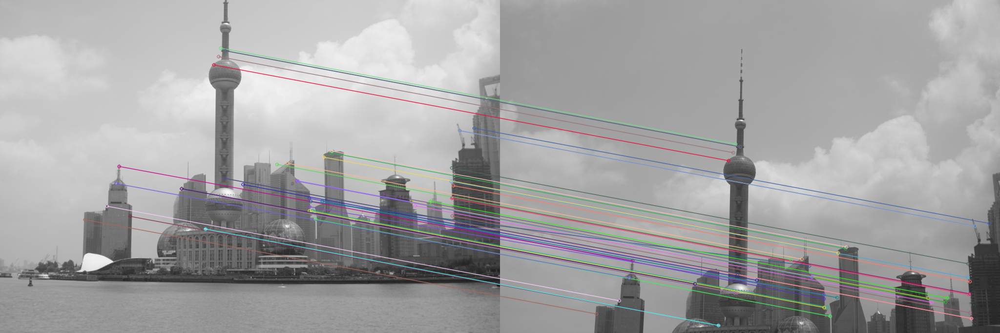

In [ ]:
img1 = cv.imread("/content/shanghai-21.png")
img2 = cv.imread("/content/shanghai-22.png")
assert type(img1) is np.ndarray
assert type(img2) is np.ndarray
keypoints_1, keypoints_2, matches = correspondence(img1, img2)

In [ ]:
H=findHomography(keypoints_1, keypoints_2,matches)
H

array([[ 9.55723700e-01, -5.02581612e-02,  4.78661666e+01],
       [-8.19687632e-03,  9.24356174e-01,  2.05628304e+02],
       [-1.99670456e-05, -8.02592269e-05,  1.00000000e+00]])

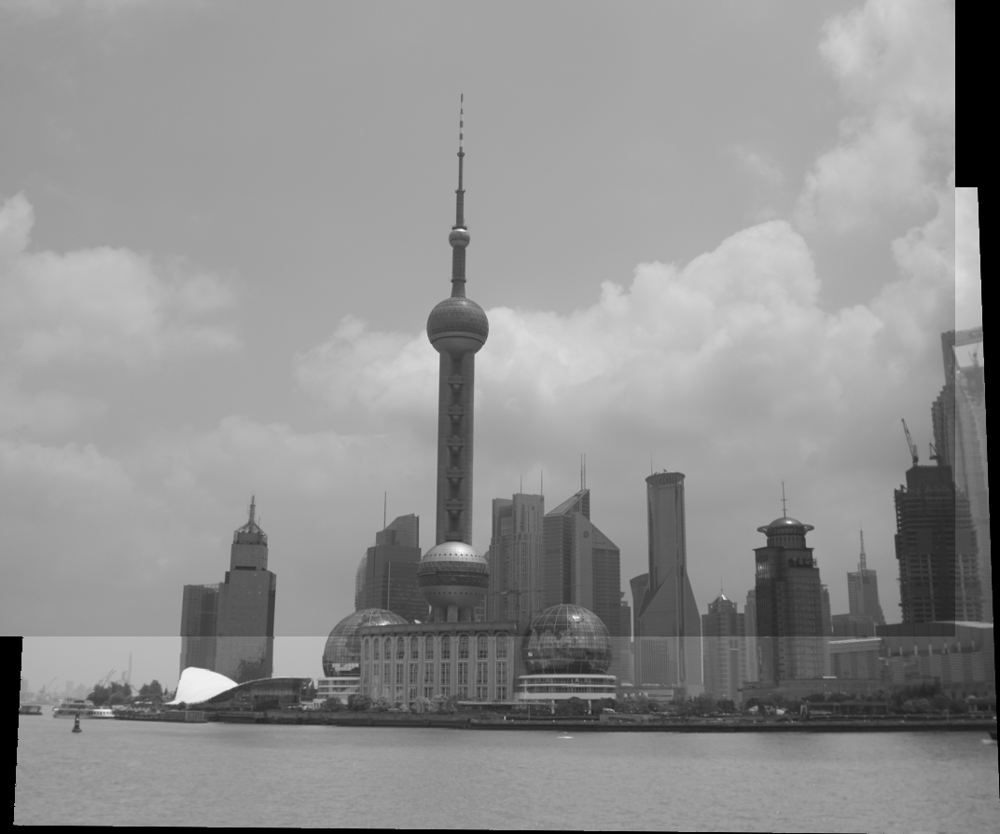

In [ ]:
result =warpPerspective(img1,H,(img1.shape[1]+img2.shape[1],img1.shape[0]+img2.shape[0]))
result[0:img2.shape[0], 0:img2.shape[1]] = img2
cv2_imshow(remove_zero_pad(result))

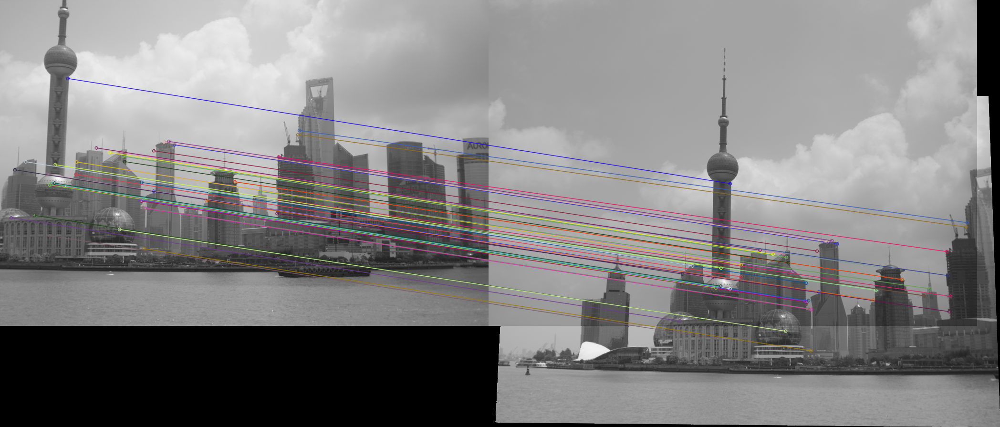

In [ ]:
img1=np.uint8(remove_zero_pad(result))
img2 = cv.imread("/content/shanghai-23.png")
assert type(img2) is np.ndarray
keypoints_1, keypoints_2, matches = correspondence(img2, img1)
H=findHomography(keypoints_1, keypoints_2,matches)
res =cv.warpPerspective(img2,H,(img1.shape[1]+img2.shape[1],img1.shape[0]+img2.shape[0]))

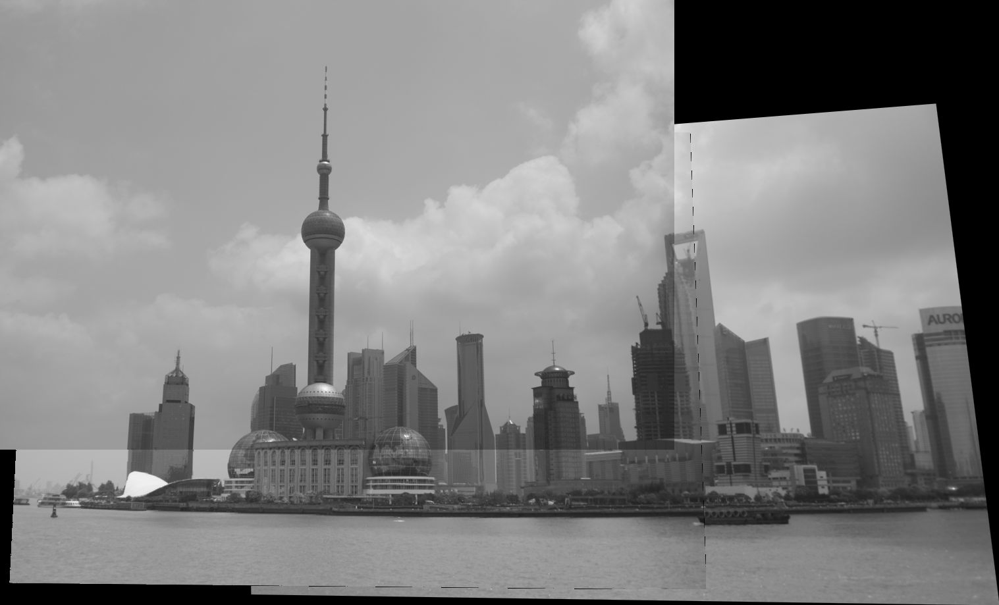

In [ ]:
# res[0:img1.shape[0], 0:img1.shape[1]] = img1
x,y,_=np.nonzero(img1)
for i,j in zip(x,y):
  res[i,j,:]=img1[i,j,:]
cv2_imshow(remove_zero_pad(res))

# References

## Links: